In [1]:
import gym 
import torch
import torch.nn as nn
from torch.autograd import Variable
env = gym.make('CartPole-v0')


/home/prayash/.local/lib/python3.10/site-packages/gym/envs/registration.py:555: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(


In [10]:
class PolicyNetwork():
    def __init__(self,n_state,n_action,n_hidden=50,lr=0.001):
        self.model = nn.Sequential(
            nn.Linear(n_state,n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden,n_action),
            nn.Softmax()
        )

        self.optimizer = torch.optim.Adam(self.model.parameters(), lr)

    def predict(self,s):
        return self.model(torch.Tensor(s))

    def update(self, advantags, log_probs):
        policy_gradient =[]
        for log_prob , Gt in zip(log_probs, advantags):
            policy_gradient.append(-log_prob* Gt)
        print(policy_gradient)
        loss = torch.stack(policy_gradient).sum()
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
    def get_action(self, s):
        probs = self.predict(s)
        action = torch.multinomial(probs, 1).item()
        log_prob = torch.log(probs[action])
        return action , log_prob


In [11]:
class ValueNetwork():
    def __init__(self, n_state, n_hidden=50, lr = 0.05):
        self.criterion = nn.MSELoss()
        self.model = torch.nn.Sequential(
            torch.nn.Linear(n_state, n_hidden),
            nn.ReLU(),
            nn.Linear(n_hidden,1)

        )
        self.optimizer = torch.optim.Adam(self.model.parameters(),lr)

    
    def update(self, s, y):
        y_pred = self.model(torch.Tensor(s))
        loss = self.criterion(y_pred,Variable(torch.Tensor(y)))
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def predict(self, s):
        with torch.no_grad():
            return self.model(torch.Tensor(s))



In [12]:
def reinforce(env,estimator_policy,estimator_value, n_episode, gamma =1):
    for episode in range(n_episode):
        log_probs =[]
        states =[]
        rewards = []
        is_done = False
        state, _ = env.reset()
        while True:
            states.append(state)
            action, log_prob = estimator_policy.get_action(state)
            next_state, reward , terminated , truncated, _ = env.step(action)
            if terminated or truncated:
                is_done = True
            total_reward_episode[episode] += reward
            log_probs.append(log_prob)
            rewards.append(reward)

            if is_done:
                Gt=0 
                pw = 0 
                returns = []
                for t in range(len(states)-1,-1,-1):
                    Gt += gamma ** pw * rewards[t]
                    pw += 1
                    returns.append(Gt)
               # print(returns)
                returns = returns[::-1]
                returns = torch.tensor(returns)

                baseline_values = estimator_value.predict(states)

                advantages = returns - baseline_values
                estimator_value.update(states,returns)
                estimator_policy.update(advantages, log_probs)
                print('Episode:{}, total reward: {}'.format(episode, total_reward_episode[episode]))
                break
            state = next_state
            

                

            


In [13]:
n_state  = env.observation_space.shape[0]
n_action = env.action_space.n
n_hidden_p = 64
lr_p = 0.003
policy_net = PolicyNetwork(n_state, n_action, n_hidden_p , lr_p)

n_hidden_v = 64
lr_v = 0.003
value_net = ValueNetwork(n_state, n_hidden_v, lr_v)
gamma=0.9

In [14]:
n_episode = 2000
total_reward_episode = [0] * n_episode
reinforce(env, policy_net, value_net, n_episode, gamma)     

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([18])) that is different to the input size (torch.Size([18, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([12])) that is different to the input size (torch.Size([12, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/m

[tensor([5.8138, 5.6981, 5.5694, 5.4265, 5.2677, 5.0913, 4.8952, 4.6774, 4.4354,
        4.1665, 3.8677, 3.5356, 3.1668, 2.7569, 2.3015, 1.7954, 1.2332, 0.6085],
       grad_fn=<MulBackward0>), tensor([5.5537, 5.4429, 5.3199, 5.1832, 5.0313, 4.8625, 4.6750, 4.4667, 4.2351,
        3.9779, 3.6921, 3.3745, 3.0216, 2.6296, 2.1939, 1.7099, 1.1721, 0.5745],
       grad_fn=<MulBackward0>), tensor([6.3140, 6.1880, 6.0480, 5.8924, 5.7196, 5.5275, 5.3141, 5.0769, 4.8135,
        4.5207, 4.1954, 3.8340, 3.4324, 2.9862, 2.4904, 1.9396, 1.3275, 0.6474],
       grad_fn=<MulBackward0>), tensor([6.0487, 5.9281, 5.7942, 5.6453, 5.4799, 5.2961, 5.0919, 4.8651, 4.6130,
        4.3329, 4.0216, 3.6758, 3.2916, 2.8647, 2.3903, 1.8632, 1.2776, 0.6269],
       grad_fn=<MulBackward0>), tensor([5.8207, 5.7048, 5.5761, 5.4330, 5.2740, 5.0974, 4.9011, 4.6831, 4.4408,
        4.1715, 3.8724, 3.5400, 3.1707, 2.7604, 2.3045, 1.7979, 1.2350, 0.6096],
       grad_fn=<MulBackward0>), tensor([5.5570, 5.4462, 5.3231, 5.

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([19])) that is different to the input size (torch.Size([19, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 4.0228,  3.7805,  3.5113,  3.2122,  2.8799,  2.5106,  2.1003,  1.6445,
         1.1380,  0.5752, -0.0502, -0.7450], grad_fn=<MulBackward0>), tensor([ 4.2858,  4.0226,  3.7301,  3.4052,  3.0442,  2.6431,  2.1974,  1.7021,
         1.1519,  0.5405, -0.1388, -0.8936], grad_fn=<MulBackward0>), tensor([ 2.4450,  2.2906,  2.1191,  1.9285,  1.7167,  1.4814,  1.2199,  0.9294,
         0.6066,  0.2479, -0.1506, -0.5934], grad_fn=<MulBackward0>), tensor([ 4.2941,  4.0303,  3.7373,  3.4116,  3.0498,  2.6477,  2.2010,  1.7046,
         1.1531,  0.5404, -0.1405, -0.8970], grad_fn=<MulBackward0>), tensor([ 4.7256,  4.4268,  4.0948,  3.7258,  3.3159,  2.8605,  2.3544,  1.7921,
         1.1673,  0.4731, -0.2982, -1.1552], grad_fn=<MulBackward0>), tensor([ 5.1612,  4.8194,  4.4396,  4.0176,  3.5487,  3.0278,  2.4489,  1.8057,
         1.0911,  0.2970, -0.5852, -1.5655], grad_fn=<MulBackward0>), tensor([ 5.5168,  5.1276,  4.6951,  4.2146,  3.6806,  3.0874,  2.4282,  1.6958,
         0.8820, -0

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([87])) that is different to the input size (torch.Size([87, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 4.6972,  4.6972,  4.6971,  4.6971,  4.6970,  4.6970,  4.6969,  4.6968,
         4.6967,  4.6966,  4.6965,  4.6964,  4.6962,  4.6961,  4.6959,  4.6957,
         4.6955,  4.6953,  4.6950,  4.6947,  4.6944,  4.6940,  4.6937,  4.6932,
         4.6927,  4.6922,  4.6916,  4.6909,  4.6902,  4.6893,  4.6884,  4.6874,
         4.6863,  4.6850,  4.6836,  4.6820,  4.6803,  4.6784,  4.6762,  4.6739,
         4.6712,  4.6683,  4.6650,  4.6614,  4.6574,  4.6529,  4.6480,  4.6424,
         4.6363,  4.6295,  4.6219,  4.6135,  4.6042,  4.5938,  4.5822,  4.5694,
         4.5552,  4.5393,  4.5218,  4.5022,  4.4805,  4.4564,  4.4296,  4.3998,
         4.3667,  4.3300,  4.2891,  4.2437,  4.1933,  4.1372,  4.0750,  4.0058,
         3.9289,  3.8435,  3.7486,  3.6432,  3.5260,  3.3958,  3.2512,  3.0905,
         2.9119,  2.7135,  2.4930,  2.2481,  1.9759,  1.6735,  1.3375,  0.9642,
         0.5493,  0.0884, -0.4237, -0.9928], grad_fn=<MulBackward0>), tensor([ 4.9256,  4.9256,  4.9255,  4.9255,  4.92

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1778,
         5.1778,  5.1778,  5.1778,  5.1778,  5.1778,  5.1777,  5.1777,  5.1777,
         5.1777,  5.1777,  5.1777,  5.1777,  5.1777,  5.1776,  5.1776,  5.1776,
         5.1776,  5.1775,  5.1775,  5.1775,  5.1774,  5.1774,  5.1773,  5.1773,
         5.1772,  5.1771,  5.1771,  5.1

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([78])) that is different to the input size (torch.Size([78, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 2.9244,  2.8310,  2.7273,  2.6121,  2.4841,  2.3419,  2.1838,  2.0082,
         1.8131,  1.5963,  1.3555,  1.0878,  0.7904,  0.4600,  0.0929, -0.3151,
        -0.7683, -1.2720, -1.8315, -2.4533], grad_fn=<MulBackward0>), tensor([ 3.1926,  3.0812,  2.9574,  2.8199,  2.6671,  2.4973,  2.3087,  2.0991,
         1.8662,  1.6074,  1.3199,  1.0004,  0.6455,  0.2511, -0.1871, -0.6741,
        -1.2151, -1.8162, -2.4841, -3.2262], grad_fn=<MulBackward0>), tensor([ 1.4186,  1.3619,  1.2989,  1.2289,  1.1512,  1.0648,  0.9688,  0.8621,
         0.7436,  0.6119,  0.4656,  0.3030,  0.1223, -0.0784, -0.3014, -0.5492,
        -0.8246, -1.1305, -1.4704, -1.8481], grad_fn=<MulBackward0>), tensor([ 2.2027,  2.1257,  2.0401,  1.9450,  1.8394,  1.7220,  1.5916,  1.4467,
         1.2856,  1.1067,  0.9079,  0.6870,  0.4416,  0.1689, -0.1341, -0.4707,
        -0.8448, -1.2604, -1.7222, -2.2354], grad_fn=<MulBackward0>), tensor([ 2.9636,  2.8688,  2.7634,  2.6464,  2.5163,  2.3718,  2.2112,  2.0328,

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

Episode:91, total reward: 75.0
[tensor([ 3.1465,  3.1065,  3.0621,  3.0127,  2.9578,  2.8969,  2.8291,  2.7539,
         2.6702,  2.5773,  2.4741,  2.3594,  2.2320,  2.0903,  1.9330,  1.7582,
         1.5639,  1.3481,  1.1083,  0.8418,  0.5457,  0.2168, -0.1488, -0.5549,
        -1.0062, -1.5075, -2.0647, -2.6837, -3.3715], grad_fn=<MulBackward0>), tensor([ 3.4132,  3.3655,  3.3126,  3.2537,  3.1883,  3.1157,  3.0350,  2.9453,
         2.8456,  2.7349,  2.6118,  2.4751,  2.3232,  2.1545,  1.9669,  1.7586,
         1.5271,  1.2698,  0.9840,  0.6664,  0.3136, -0.0785, -0.5142, -0.9982,
        -1.5360, -2.1336, -2.7976, -3.5353, -4.3550], grad_fn=<MulBackward0>), tensor([ 1.1850,  1.1660,  1.1447,  1.1212,  1.0950,  1.0659,  1.0336,  0.9977,
         0.9577,  0.9134,  0.8641,  0.8094,  0.7485,  0.6810,  0.6059,  0.5224,
         0.4297,  0.3267,  0.2122,  0.0850, -0.0563, -0.2133, -0.3878, -0.5816,
        -0.7970, -1.0363, -1.3022, -1.5977, -1.9259], grad_fn=<MulBackward0>), tensor([ 3.

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([44])) that is different to the input size (torch.Size([44, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([96])) that is different to the input size (torch.Size([96, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 1.8671,  1.7934,  1.7114,  1.6204,  1.5192,  1.4068,  1.2819,  1.1431,
         0.9889,  0.8176,  0.6272,  0.4157,  0.1807, -0.0805, -0.3706, -0.6930,
        -1.0512, -1.4492, -1.8915, -2.3829, -2.9288], grad_fn=<MulBackward0>), tensor([ 2.0498,  1.9702,  1.8819,  1.7837,  1.6745,  1.5533,  1.4186,  1.2689,
         1.1026,  0.9178,  0.7125,  0.4844,  0.2309, -0.0507, -0.3637, -0.7114,
        -1.0977, -1.5270, -2.0039, -2.5339, -3.1227], grad_fn=<MulBackward0>), tensor([ 1.8295,  1.7566,  1.6756,  1.5856,  1.4857,  1.3746,  1.2512,  1.1141,
         0.9617,  0.7924,  0.6043,  0.3953,  0.1631, -0.0950, -0.3817, -0.7002,
        -1.0542, -1.4474, -1.8844, -2.3699, -2.9094], grad_fn=<MulBackward0>), tensor([ 2.0647,  1.9843,  1.8949,  1.7957,  1.6853,  1.5628,  1.4266,  1.2753,
         1.1071,  0.9203,  0.7127,  0.4821,  0.2258, -0.0589, -0.3753, -0.7268,
        -1.1174, -1.5514, -2.0336, -2.5694, -3.1647], grad_fn=<MulBackward0>), tensor([ 1.7986,  1.7265,  1.6463,  1.5572,

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([77])) that is different to the input size (torch.Size([77, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

Episode:109, total reward: 77.0
[tensor([ 2.8936,  2.8774,  2.8593,  2.8393,  2.8170,  2.7922,  2.7647,  2.7341,
         2.7002,  2.6624,  2.6205,  2.5739,  2.5221,  2.4646,  2.4007,  2.3296,
         2.2507,  2.1630,  2.0656,  1.9574,  1.8371,  1.7034,  1.5549,  1.3899,
         1.2066,  1.0029,  0.7766,  0.5251,  0.2457, -0.0648, -0.4097, -0.7930,
        -1.2189, -1.6921, -2.2179, -2.8021, -3.4512, -4.1724],
       grad_fn=<MulBackward0>), tensor([ 3.2063,  3.1868,  3.1652,  3.1411,  3.1144,  3.0847,  3.0517,  3.0150,
         2.9743,  2.9290,  2.8787,  2.8228,  2.7607,  2.6917,  2.6151,  2.5299,
         2.4353,  2.3301,  2.2133,  2.0835,  1.9392,  1.7790,  1.6009,  1.4030,
         1.1832,  0.9389,  0.6675,  0.3659,  0.0308, -0.3415, -0.7552, -1.2149,
        -1.7256, -2.2931, -2.9236, -3.6242, -4.4026, -5.2675],
       grad_fn=<MulBackward0>), tensor([ 0.9818,  0.9750,  0.9674,  0.9590,  0.9497,  0.9393,  0.9278,  0.9150,
         0.9008,  0.8850,  0.8674,  0.8479,  0.8262,  0.8

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([80])) that is different to the input size (torch.Size([80, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 2.5715,  2.5714,  2.5713,  2.5712,  2.5711,  2.5709,  2.5708,  2.5706,
         2.5704,  2.5702,  2.5700,  2.5697,  2.5694,  2.5691,  2.5688,  2.5684,
         2.5679,  2.5675,  2.5669,  2.5663,  2.5657,  2.5649,  2.5641,  2.5632,
         2.5622,  2.5611,  2.5598,  2.5584,  2.5569,  2.5552,  2.5533,  2.5511,
         2.5488,  2.5462,  2.5433,  2.5401,  2.5365,  2.5325,  2.5281,  2.5232,
         2.5177,  2.5117,  2.5049,  2.4974,  2.4891,  2.4799,  2.4696,  2.4582,
         2.4455,  2.4314,  2.4158,  2.3984,  2.3791,  2.3576,  2.3337,  2.3072,
         2.2778,  2.2451,  2.2087,  2.1683,  2.1234,  2.0736,  2.0181,  1.9566,
         1.8882,  1.8121,  1.7277,  1.6338,  1.5296,  1.4137,  1.2850,  1.1419,
         0.9830,  0.8064,  0.6102,  0.3922,  0.1500, -0.1192, -0.4182, -0.7505,
        -1.1197, -1.5299, -1.9857, -2.4922, -3.0549, -3.6802, -4.3749],
       grad_fn=<MulBackward0>), tensor([ 1.5319,  1.5319,  1.5318,  1.5318,  1.5317,  1.5316,  1.5315,  1.5314,
         1.5313

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([53])) that is different to the input size (torch.Size([53, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([85])) that is different to the input size (torch.Size([85, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

Episode:130, total reward: 72.0
[tensor([ 2.1403,  2.1401,  2.1399,  2.1396,  2.1394,  2.1391,  2.1387,  2.1384,
         2.1380,  2.1375,  2.1370,  2.1365,  2.1359,  2.1352,  2.1344,  2.1336,
         2.1327,  2.1316,  2.1305,  2.1292,  2.1278,  2.1262,  2.1244,  2.1225,
         2.1203,  2.1179,  2.1152,  2.1122,  2.1089,  2.1053,  2.1012,  2.0966,
         2.0916,  2.0860,  2.0798,  2.0729,  2.0652,  2.0567,  2.0472,  2.0366,
         2.0249,  2.0119,  1.9975,  1.9814,  1.9636,  1.9438,  1.9217,  1.8973,
         1.8701,  1.8399,  1.8063,  1.7690,  1.7276,  1.6815,  1.6303,  1.5735,
         1.5103,  1.4401,  1.3622,  1.2755,  1.1792,  1.0723,  0.9534,  0.8213,
         0.6746,  0.5115,  0.3304,  0.1291, -0.0946, -0.3431, -0.6192, -0.9260,
        -1.2669, -1.6456, -2.0665, -2.5341, -3.0536, -3.6309, -4.2724],
       grad_fn=<MulBackward0>), tensor([ 1.5124,  1.5123,  1.5121,  1.5119,  1.5117,  1.5115,  1.5112,  1.5110,
         1.5107,  1.5103,  1.5100,  1.5095,  1.5091,  1.5086,  

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 2.0614,  2.0607,  2.0600,  2.0591,  2.0582,  2.0571,  2.0559,  2.0546,
         2.0532,  2.0516,  2.0498,  2.0478,  2.0456,  2.0432,  2.0405,  2.0375,
         2.0341,  2.0304,  2.0262,  2.0216,  2.0165,  2.0108,  2.0045,  1.9975,
         1.9897,  1.9811,  1.9715,  1.9608,  1.9489,  1.9357,  1.9210,  1.9048,
         1.8867,  1.8665,  1.8442,  1.8194,  1.7918,  1.7611,  1.7271,  1.6893,
         1.6472,  1.6005,  1.5486,  1.4909,  1.4268,  1.3556,  1.2765,  1.1886,
         1.0910,  0.9824,  0.8619,  0.7279,  0.5790,  0.4136,  0.2299,  0.0257,
        -0.2012, -0.4533, -0.7334, -1.0446, -1.3905, -1.7747, -2.2016, -2.6760,
        -3.2030, -3.7887, -4.4394], grad_fn=<MulBackward0>), tensor([ 2.4843,  2.4835,  2.4825,  2.4815,  2.4803,  2.4790,  2.4776,  2.4759,
         2.4742,  2.4722,  2.4700,  2.4675,  2.4648,  2.4618,  2.4585,  2.4547,
         2.4506,  2.4460,  2.4409,  2.4352,  2.4289,  2.4219,  2.4141,  2.4054,
         2.3958,  2.3851,  2.3733,  2.3601,  2.3454,  2.32

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([191])) that is different to the input size (torch.Size([191, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,
         1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9630,  1.9629,
         1.9629,  1.9629,  1.9629,  1.9629,  1.9629,  1.9629,  1.9629,  1.9629,
         1.9629,  1.9628,  1.9628,  1.9628,  1.9628,  1.9628,  1.9627,  1.9627,
         1.9627,  1.9626,  1.9626,  1.9

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([73])) that is different to the input size (torch.Size([73, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([121])) that is different to the input size (torch.Size([121, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same 

Episode:152, total reward: 121.0
[tensor([ 1.8748,  1.8650,  1.8540,  1.8419,  1.8284,  1.8134,  1.7967,  1.7782,
         1.7576,  1.7347,  1.7093,  1.6811,  1.6497,  1.6148,  1.5761,  1.5331,
         1.4853,  1.4321,  1.3731,  1.3075,  1.2346,  1.1537,  1.0637,  0.9637,
         0.8526,  0.7292,  0.5921,  0.4397,  0.2704,  0.0823, -0.1267, -0.3590,
        -0.6170, -0.9037, -1.2223, -1.5762, -1.9695, -2.4065, -2.8921, -3.4316,
        -4.0310, -4.6971], grad_fn=<MulBackward0>), tensor([ 1.2546,  1.2479,  1.2405,  1.2322,  1.2231,  1.2129,  1.2016,  1.1890,
         1.1750,  1.1595,  1.1422,  1.1231,  1.1018,  1.0781,  1.0518,  1.0226,
         0.9901,  0.9541,  0.9140,  0.8695,  0.8200,  0.7650,  0.7039,  0.6361,
         0.5607,  0.4769,  0.3838,  0.2803,  0.1654,  0.0377, -0.1042, -0.2619,
        -0.4371, -0.6317, -0.8480, -1.0883, -1.3553, -1.6520, -1.9816, -2.3478,
        -2.7548, -3.2070], grad_fn=<MulBackward0>), tensor([ 1.8875,  1.8776,  1.8665,  1.8543,  1.8407,  1.8256, 

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([153])) that is different to the input size (torch.Size([153, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([60])) that is different to the input size (torch.Size([60, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,
         1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,
         1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,
         1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,  1.7367,
         1.7367,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,
         1.7366,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,  1.7366,
         1.7366,  1.7366,  1.7365,  1.7365,  1.7365,  1.7365,  1.7365,  1.7365,
         1.7364,  1.7364,  1.7364,  1.7364,  1.7363,  1.7363,  1.7362,  1.7362,
         1.7361,  1.7361,  1.7360,  1.7359,  1.7358,  1.7358,  1.7357,  1.7355,
         1.7354,  1.7353,  1.7351,  1.7349,  1.7348,  1.7345,  1.7343,  1.7340,
         1.7337,  1.7334,  1.7331,  1.7327,  1.7322,  1.7317,  1.7312,  1.7306,
         1.7299,  1.7291,  1.7283,  1.7273,  1.7263,  1.7252,  1.7239,  1.7225,
         1.7209,  1.7191,  1.7172,  1.7

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([66])) that is different to the input size (torch.Size([66, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.7300,  1.7248,  1.7190,  1.7126,  1.7055,  1.6975,  1.6887,  1.6789,
         1.6680,  1.6560,  1.6425,  1.6276,  1.6110,  1.5926,  1.5721,  1.5494,
         1.5241,  1.4960,  1.4648,  1.4301,  1.3916,  1.3488,  1.3012,  1.2483,
         1.1896,  1.1244,  1.0519,  0.9713,  0.8818,  0.7824,  0.6719,  0.5491,
         0.4127,  0.2611,  0.0927, -0.0945, -0.3024, -0.5334, -0.7901, -1.0753,
        -1.3922, -1.7444, -2.1356, -2.5703, -3.0533, -3.5900, -4.1864],
       grad_fn=<MulBackward0>), tensor([ 1.9959,  1.9893,  1.9820,  1.9739,  1.9649,  1.9550,  1.9439,  1.9315,
         1.9178,  1.9026,  1.8857,  1.8669,  1.8460,  1.8228,  1.7970,  1.7683,
         1.7365,  1.7011,  1.6618,  1.6181,  1.5696,  1.5156,  1.4557,  1.3892,
         1.3152,  1.2330,  1.1417,  1.0402,  0.9275,  0.8022,  0.6630,  0.5084,
         0.3366,  0.1456, -0.0665, -0.3022, -0.5641, -0.8551, -1.1785, -1.5377,
        -1.9369, -2.3804, -2.8732, -3.4208, -4.0292, -4.7052, -5.4563],
       grad_fn=<MulBack

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([69])) that is different to the input size (torch.Size([69, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same si

[tensor([ 1.8624,  1.8614,  1.8602,  1.8588,  1.8573,  1.8557,  1.8538,  1.8518,
         1.8495,  1.8470,  1.8442,  1.8411,  1.8377,  1.8338,  1.8296,  1.8248,
         1.8196,  1.8137,  1.8072,  1.8000,  1.7920,  1.7831,  1.7732,  1.7622,
         1.7499,  1.7363,  1.7212,  1.7045,  1.6858,  1.6651,  1.6421,  1.6166,
         1.5882,  1.5566,  1.5215,  1.4826,  1.4393,  1.3912,  1.3377,  1.2783,
         1.2124,  1.1390,  1.0576,  0.9671,  0.8665,  0.7548,  0.6306,  0.4926,
         0.3394,  0.1690, -0.0202, -0.2305, -0.4641, -0.7237, -1.0121, -1.3326,
        -1.6887, -2.0843, -2.5239, -3.0124, -3.5551, -4.1581],
       grad_fn=<MulBackward0>), tensor([ 2.1637,  2.1623,  2.1607,  2.1590,  2.1571,  2.1549,  2.1526,  2.1499,
         2.1470,  2.1438,  2.1402,  2.1361,  2.1317,  2.1267,  2.1212,  2.1151,
         2.1084,  2.1008,  2.0924,  2.0831,  2.0728,  2.0613,  2.0485,  2.0343,
         2.0185,  2.0010,  1.9815,  1.9599,  1.9359,  1.9092,  1.8795,  1.8465,
         1.8099,  1.7692

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([86])) that is different to the input size (torch.Size([86, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([111])) that is different to the input size (torch.Size([111, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.8471,  1.8471,  1.8471,  1.8471,  1.8471,  1.8471,  1.8471,  1.8471,
         1.8470,  1.8470,  1.8470,  1.8470,  1.8470,  1.8470,  1.8469,  1.8469,
         1.8469,  1.8468,  1.8468,  1.8468,  1.8467,  1.8467,  1.8466,  1.8466,
         1.8465,  1.8464,  1.8463,  1.8462,  1.8461,  1.8460,  1.8459,  1.8457,
         1.8456,  1.8454,  1.8452,  1.8450,  1.8447,  1.8445,  1.8442,  1.8438,
         1.8435,  1.8430,  1.8426,  1.8421,  1.8415,  1.8409,  1.8402,  1.8394,
         1.8385,  1.8376,  1.8365,  1.8353,  1.8340,  1.8325,  1.8309,  1.8291,
         1.8271,  1.8249,  1.8224,  1.8197,  1.8166,  1.8132,  1.8094,  1.8052,
         1.8006,  1.7954,  1.7896,  1.7832,  1.7761,  1.7682,  1.7595,  1.7497,
         1.7389,  1.7269,  1.7135,  1.6987,  1.6822,  1.6638,  1.6434,  1.6208,
         1.5957,  1.5677,  1.5367,  1.5022,  1.4638,  1.4212,  1.3739,  1.3213,
         1.2629,  1.1980,  1.1258,  1.0457,  0.9566,  0.8577,  0.7477,  0.6256,
         0.4899,  0.3390,  0.1715, -0.0

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([74])) that is different to the input size (torch.Size([74, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.9474,  1.9467,  1.9459,  1.9451,  1.9441,  1.9431,  1.9419,  1.9406,
         1.9392,  1.9376,  1.9358,  1.9339,  1.9317,  1.9293,  1.9266,  1.9236,
         1.9202,  1.9165,  1.9124,  1.9078,  1.9027,  1.8971,  1.8908,  1.8839,
         1.8761,  1.8675,  1.8580,  1.8473,  1.8355,  1.8224,  1.8078,  1.7916,
         1.7737,  1.7537,  1.7315,  1.7068,  1.6794,  1.6489,  1.6150,  1.5774,
         1.5356,  1.4892,  1.4376,  1.3803,  1.3166,  1.2458,  1.1672,  1.0798,
         0.9827,  0.8748,  0.7550,  0.6218,  0.4738,  0.3094,  0.1267, -0.0762,
        -0.3018, -0.5524, -0.8308, -1.1402, -1.4839, -1.8659, -2.2903, -2.7618,
        -3.2857, -3.8679, -4.5147], grad_fn=<MulBackward0>), tensor([ 2.3134,  2.3125,  2.3115,  2.3104,  2.3091,  2.3077,  2.3062,  2.3044,
         2.3025,  2.3004,  2.2980,  2.2954,  2.2925,  2.2892,  2.2856,  2.2816,
         2.2772,  2.2722,  2.2667,  2.2606,  2.2538,  2.2463,  2.2379,  2.2286,
         2.2182,  2.2067,  2.1939,  2.1798,  2.1640,  2.14

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.2188,  1.1476,  1.0686,  0.9807,  0.8831,  0.7746,  0.6541,  0.5202,
         0.3714,  0.2061,  0.0224, -0.1816, -0.4084, -0.6604, -0.9403, -1.2514,
        -1.5970, -1.9811, -2.4078, -2.8819, -3.4087, -3.9940, -4.6443],
       grad_fn=<MulBackward0>), tensor([ 0.6352,  0.5894,  0.5384,  0.4817,  0.4187,  0.3488,  0.2711,  0.1847,
         0.0887, -0.0179, -0.1363, -0.2680, -0.4142, -0.5767, -0.7573, -0.9579,
        -1.1808, -1.4285, -1.7037, -2.0095, -2.3492, -2.7267, -3.1462],
       grad_fn=<MulBackward0>), tensor([ 1.2422e+00,  1.1684e+00,  1.0864e+00,  9.9535e-01,  8.9415e-01,
         7.8171e-01,  6.5677e-01,  5.1795e-01,  3.6370e-01,  1.9232e-01,
         1.8901e-03, -2.0970e-01, -4.4479e-01, -7.0601e-01, -9.9625e-01,
        -1.3187e+00, -1.6771e+00, -2.0752e+00, -2.5176e+00, -3.0091e+00,
        -3.5552e+00, -4.1621e+00, -4.8363e+00], grad_fn=<MulBackward0>), tensor([ 1.3613,  1.2594,  1.1461,  1.0203,  0.8804,  0.7250,  0.5524,  0.3606,
         0.1474, -0.0894, 

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([149])) that is different to the input size (torch.Size([149, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,
         1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,
         1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,
         1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,
         1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7445,  1.7444,  1.7444,
         1.7444,  1.7444,  1.7444,  1.7444,  1.7444,  1.7444,  1.7444,  1.7444,
         1.7443,  1.7443,  1.7443,  1.7443,  1.7443,  1.7442,  1.7442,  1.7442,
         1.7441,  1.7441,  1.7440,  1.7440,  1.7439,  1.7439,  1.7438,  1.7437,
         1.7436,  1.7435,  1.7434,  1.7433,  1.7432,  1.7430,  1.7429,  1.7427,
         1.7425,  1.7422,  1.7420,  1.7417,  1.7414,  1.7411,  1.7407,  1.7403,
         1.7398,  1.7393,  1.7387,  1.7380,  1.7373,  1.7365,  1.7356,  1.7346,
         1.7335,  1.7323,  1.7310,  1.7295,  1.7278,  1.7259,  1.7239,  1.7216,
         1.7190,  1.7162,  1.7130,  1.7

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([123])) that is different to the input size (torch.Size([123, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([93])) that is different to the input size (torch.Size([93, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the sam

Episode:215, total reward: 123.0
[tensor([ 1.6403,  1.6402,  1.6402,  1.6401,  1.6401,  1.6400,  1.6399,  1.6399,
         1.6398,  1.6397,  1.6396,  1.6394,  1.6393,  1.6392,  1.6390,  1.6388,
         1.6386,  1.6384,  1.6381,  1.6378,  1.6375,  1.6372,  1.6368,  1.6363,
         1.6359,  1.6353,  1.6347,  1.6341,  1.6333,  1.6325,  1.6316,  1.6306,
         1.6295,  1.6283,  1.6269,  1.6253,  1.6236,  1.6218,  1.6197,  1.6173,
         1.6147,  1.6118,  1.6086,  1.6051,  1.6011,  1.5967,  1.5919,  1.5864,
         1.5804,  1.5737,  1.5663,  1.5580,  1.5488,  1.5386,  1.5273,  1.5147,
         1.5007,  1.4851,  1.4678,  1.4486,  1.4273,  1.4036,  1.3773,  1.3480,
         1.3155,  1.2793,  1.2392,  1.1946,  1.1450,  1.0899,  1.0287,  0.9608,
         0.8852,  0.8013,  0.7080,  0.6044,  0.4892,  0.3613,  0.2191,  0.0612,
        -0.1143, -0.3093, -0.5260, -0.7667, -1.0342, -1.3314, -1.6616, -2.0285,
        -2.4362, -2.8892, -3.3925, -3.9518, -4.5731], grad_fn=<MulBackward0>), tensor(

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.3526,  1.3526,  1.3526,  1.3526,  1.3526,  1.3526,  1.3526,  1.3525,
         1.3525,  1.3525,  1.3525,  1.3525,  1.3525,  1.3524,  1.3524,  1.3524,
         1.3523,  1.3523,  1.3523,  1.3522,  1.3522,  1.3521,  1.3521,  1.3520,
         1.3519,  1.3519,  1.3518,  1.3517,  1.3516,  1.3514,  1.3513,  1.3511,
         1.3510,  1.3508,  1.3506,  1.3503,  1.3501,  1.3498,  1.3495,  1.3491,
         1.3487,  1.3483,  1.3478,  1.3473,  1.3467,  1.3460,  1.3453,  1.3444,
         1.3435,  1.3425,  1.3414,  1.3401,  1.3387,  1.3372,  1.3355,  1.3335,
         1.3314,  1.3291,  1.3264,  1.3235,  1.3203,  1.3167,  1.3127,  1.3083,
         1.3033,  1.2978,  1.2917,  1.2850,  1.2775,  1.2691,  1.2598,  1.2495,
         1.2380,  1.2253,  1.2111,  1.1954,  1.1779,  1.1585,  1.1370,  1.1130,
         1.0864,  1.0568,  1.0239,  0.9874,  0.9468,  0.9017,  0.8516,  0.7959,
         0.7341,  0.6653,  0.5889,  0.5041,  0.4098,  0.3050,  0.1886,  0.0593,
        -0.0844, -0.2441, -0.4215, -0.6

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([122])) that is different to the input size (torch.Size([122, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([173])) that is different to the input size (torch.Size([173, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the sam

[tensor([ 1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,
         1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,
         1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,
         1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,
         1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,
         1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2031,  1.2030,
         1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,
         1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,
         1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2030,  1.2029,  1.2029,
         1.2029,  1.2029,  1.2029,  1.2029,  1.2028,  1.2028,  1.2028,  1.2028,
         1.2027,  1.2027,  1.2027,  1.2026,  1.2026,  1.2025,  1.2024,  1.2024,
         1.2023,  1.2022,  1.2021,  1.2020,  1.2019,  1.2018,  1.2016,  1.2015,
         1.2013,  1.2011,  1.2009,  1.2

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([95])) that is different to the input size (torch.Size([95, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([70])) that is different to the input size (torch.Size([70, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([200])) that is different to the input size (torch.Size([200, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same 

[tensor([ 1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,  1.2301,
         1.2301,  1.2301,  1.2301,  1.2301,  1.2300,  1.2300,  1.2300,  1.2300,
         1.2300,  1.2300,  1.2300,  1.2

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([84])) that is different to the input size (torch.Size([84, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([142])) that is different to the input size (torch.Size([142, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same 

[tensor([ 1.2366,  1.2346,  1.2324,  1.2300,  1.2273,  1.2243,  1.2210,  1.2173,
         1.2132,  1.2086,  1.2035,  1.1979,  1.1916,  1.1847,  1.1769,  1.1683,
         1.1588,  1.1482,  1.1364,  1.1233,  1.1088,  1.0926,  1.0746,  1.0547,
         1.0325,  1.0079,  0.9805,  0.9501,  0.9163,  0.8787,  0.8370,  0.7907,
         0.7392,  0.6819,  0.6183,  0.5477,  0.4692,  0.3819,  0.2850,  0.1773,
         0.0577, -0.0753, -0.2230, -0.3872, -0.5695, -0.7722, -0.9973, -1.2475,
        -1.5255, -1.8343, -2.1775, -2.5588, -2.9825, -3.4532, -3.9763, -4.5575],
       grad_fn=<MulBackward0>), tensor([ 1.6598,  1.6568,  1.6536,  1.6499,  1.6459,  1.6414,  1.6364,  1.6309,
         1.6247,  1.6179,  1.6103,  1.6019,  1.5925,  1.5821,  1.5705,  1.5576,
         1.5434,  1.5275,  1.5098,  1.4902,  1.4685,  1.4443,  1.4174,  1.3875,
         1.3543,  1.3174,  1.2765,  1.2309,  1.1803,  1.1241,  1.0617,  0.9923,
         0.9152,  0.8295,  0.7343,  0.6285,  0.5110,  0.3804,  0.2353,  0.0741,
      

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([94])) that is different to the input size (torch.Size([94, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([117])) that is different to the input size (torch.Size([117, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the sam

[tensor([ 1.4591e+00,  1.4591e+00,  1.4591e+00,  1.4591e+00,  1.4591e+00,
         1.4591e+00,  1.4591e+00,  1.4590e+00,  1.4590e+00,  1.4590e+00,
         1.4590e+00,  1.4590e+00,  1.4590e+00,  1.4590e+00,  1.4590e+00,
         1.4590e+00,  1.4589e+00,  1.4589e+00,  1.4589e+00,  1.4589e+00,
         1.4589e+00,  1.4588e+00,  1.4588e+00,  1.4588e+00,  1.4587e+00,
         1.4587e+00,  1.4586e+00,  1.4586e+00,  1.4585e+00,  1.4584e+00,
         1.4584e+00,  1.4583e+00,  1.4582e+00,  1.4581e+00,  1.4580e+00,
         1.4579e+00,  1.4577e+00,  1.4576e+00,  1.4574e+00,  1.4572e+00,
         1.4570e+00,  1.4567e+00,  1.4565e+00,  1.4562e+00,  1.4559e+00,
         1.4555e+00,  1.4551e+00,  1.4547e+00,  1.4542e+00,  1.4536e+00,
         1.4530e+00,  1.4523e+00,  1.4516e+00,  1.4507e+00,  1.4498e+00,
         1.4488e+00,  1.4476e+00,  1.4464e+00,  1.4449e+00,  1.4434e+00,
         1.4416e+00,  1.4397e+00,  1.4375e+00,  1.4351e+00,  1.4325e+00,
         1.4295e+00,  1.4262e+00,  1.4225e+00,  1.

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([97])) that is different to the input size (torch.Size([97, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([119])) that is different to the input size (torch.Size([119, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0597,  1.0597,  1.0596,  1.0595,  1.0593,  1.0592,  1.0591,  1.0589,
         1.0587,  1.0585,  1.0583,  1.0581,  1.0578,  1.0575,  1.0571,  1.0568,
         1.0564,  1.0559,  1.0554,  1.0548,  1.0542,  1.0535,  1.0527,  1.0518,
         1.0509,  1.0498,  1.0486,  1.0473,  1.0458,  1.0442,  1.0424,  1.0403,
         1.0381,  1.0356,  1.0328,  1.0298,  1.0263,  1.0226,  1.0183,  1.0137,
         1.0084,  1.0027,  0.9962,  0.9891,  0.9812,  0.9723,  0.9625,  0.9517,
         0.9396,  0.9261,  0.9112,  0.8946,  0.8762,  0.8557,  0.8329,  0.8076,
         0.7795,  0.7483,  0.7136,  0.6751,  0.6323,  0.5847,  0.5318,  0.4731,
         0.4078,  0.3353,  0.2547,  0.1652,  0.0657, -0.0448, -0.1676, -0.3041,
        -0.4557, -0.6242, -0.8114, -1.0194, -1.2505, -1.5073, -1.7926, -2.1096,
        -2.4618, -2.8532, -3.2880, -3.7712, -4.3081], grad_fn=<MulBackward0>), tensor([ 0.8423,  0.8422,  0.8421,  0.8420,  0.8419,  0.8418,  0.8417,  0.8415,
         0.8414,  0.8412,  0.8410,  0.84

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([104])) that is different to the input size (torch.Size([104, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.3631,  1.3631,  1.3630,  1.3630,  1.3630,  1.3630,  1.3630,  1.3629,
         1.3629,  1.3629,  1.3628,  1.3628,  1.3627,  1.3627,  1.3626,  1.3625,
         1.3625,  1.3624,  1.3623,  1.3622,  1.3621,  1.3620,  1.3618,  1.3617,
         1.3615,  1.3613,  1.3611,  1.3608,  1.3606,  1.3603,  1.3600,  1.3596,
         1.3592,  1.3587,  1.3583,  1.3577,  1.3571,  1.3564,  1.3556,  1.3548,
         1.3539,  1.3528,  1.3517,  1.3504,  1.3490,  1.3474,  1.3456,  1.3437,
         1.3415,  1.3391,  1.3364,  1.3334,  1.3301,  1.3264,  1.3224,  1.3178,
         1.3128,  1.3072,  1.3009,  1.2940,  1.2863,  1.2778,  1.2683,  1.2578,
         1.2460,  1.2330,  1.2186,  1.2025,  1.1846,  1.1648,  1.1427,  1.1182,
         1.0910,  1.0608,  1.0272,  0.9898,  0.9483,  0.9022,  0.8510,  0.7941,
         0.7309,  0.6606,  0.5826,  0.4958,  0.3994,  0.2924,  0.1734,  0.0412,
        -0.1057, -0.2689, -0.4503, -0.6518, -0.8757, -1.1245, -1.4009, -1.7080,
        -2.0492, -2.4284, -2.8497, -3.3

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([109])) that is different to the input size (torch.Size([109, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([163])) that is different to the input size (torch.Size([163, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.3646e+00,  1.3646e+00,  1.3646e+00,  1.3646e+00,  1.3645e+00,
         1.3645e+00,  1.3645e+00,  1.3645e+00,  1.3645e+00,  1.3645e+00,
         1.3644e+00,  1.3644e+00,  1.3644e+00,  1.3643e+00,  1.3643e+00,
         1.3643e+00,  1.3642e+00,  1.3642e+00,  1.3641e+00,  1.3640e+00,
         1.3640e+00,  1.3639e+00,  1.3638e+00,  1.3637e+00,  1.3636e+00,
         1.3635e+00,  1.3634e+00,  1.3632e+00,  1.3631e+00,  1.3629e+00,
         1.3627e+00,  1.3625e+00,  1.3622e+00,  1.3620e+00,  1.3617e+00,
         1.3613e+00,  1.3609e+00,  1.3605e+00,  1.3601e+00,  1.3596e+00,
         1.3590e+00,  1.3584e+00,  1.3577e+00,  1.3569e+00,  1.3560e+00,
         1.3550e+00,  1.3540e+00,  1.3528e+00,  1.3515e+00,  1.3500e+00,
         1.3484e+00,  1.3466e+00,  1.3445e+00,  1.3423e+00,  1.3398e+00,
         1.3371e+00,  1.3340e+00,  1.3306e+00,  1.3268e+00,  1.3226e+00,
         1.3179e+00,  1.3127e+00,  1.3070e+00,  1.3005e+00,  1.2934e+00,
         1.2855e+00,  1.2767e+00,  1.2669e+00,  1.

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([134])) that is different to the input size (torch.Size([134, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Episode:271, total reward: 134.0
[tensor([ 1.0068,  1.0068,  1.0067,  1.0067,  1.0067,  1.0067,  1.0067,  1.0067,
         1.0067,  1.0067,  1.0067,  1.0067,  1.0067,  1.0067,  1.0067,  1.0067,
         1.0066,  1.0066,  1.0066,  1.0066,  1.0066,  1.0066,  1.0065,  1.0065,
         1.0065,  1.0064,  1.0064,  1.0064,  1.0063,  1.0063,  1.0062,  1.0061,
         1.0061,  1.0060,  1.0059,  1.0058,  1.0057,  1.0056,  1.0055,  1.0053,
         1.0051,  1.0050,  1.0048,  1.0045,  1.0043,  1.0040,  1.0037,  1.0034,
         1.0030,  1.0026,  1.0021,  1.0016,  1.0010,  1.0003,  0.9996,  0.9988,
         0.9979,  0.9970,  0.9959,  0.9947,  0.9933,  0.9918,  0.9902,  0.9883,
         0.9863,  0.9840,  0.9815,  0.9786,  0.9755,  0.9720,  0.9682,  0.9639,
         0.9591,  0.9538,  0.9479,  0.9414,  0.9342,  0.9261,  0.9171,  0.9072,
         0.8961,  0.8838,  0.8701,  0.8549,  0.8381,  0.8193,  0.7985,  0.7753,
         0.7496,  0.7211,  0.6893,  0.6540,  0.6148,  0.5713,  0.5229,  0.4691,
      

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([130])) that is different to the input size (torch.Size([130, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([132])) that is different to the input size (torch.Size([132, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,
         1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,
         1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,  1.0039,
         1.0039,  1.0039,  1.0039,  1.0038,  1.0038,  1.0038,  1.0038,  1.0038,
         1.0038,  1.0038,  1.0037,  1.0037,  1.0037,  1.0036,  1.0036,  1.0036,
         1.0035,  1.0035,  1.0034,  1.0034,  1.0033,  1.0033,  1.0032,  1.0031,
         1.0030,  1.0029,  1.0028,  1.0027,  1.0025,  1.0024,  1.0022,  1.0020,
         1.0018,  1.0015,  1.0013,  1.0010,  1.0006,  1.0003,  0.9999,  0.9994,
         0.9989,  0.9984,  0.9977,  0.9970,  0.9963,  0.9954,  0.9945,  0.9934,
         0.9923,  0.9910,  0.9895,  0.9879,  0.9861,  0.9842,  0.9820,  0.9795,
         0.9768,  0.9738,  0.9704,  0.9667,  0.9626,  0.9580,  0.9529,  0.9472,
         0.9409,  0.9339,  0.9261,  0.9175,  0.9078,  0.8972,  0.8853,  0.8721,
         0.8575,  0.8412,  0.8231,  0.8

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([158])) that is different to the input size (torch.Size([158, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,  1.0117,
         1.0117,  1.0117,  1.0117,  1.0116,  1.0116,  1.0116,  1.0116,  1.0116,
         1.0116,  1.0116,  1.0116,  1.0115,  1.0115,  1.0115,  1.0115,  1.0114,
         1.0114,  1.0114,  1.0113,  1.0113,  1.0112,  1.0112,  1.0111,  1.0110,
         1.0110,  1.0109,  1.0108,  1.0107,  1.0106,  1.0104,  1.0103,  1.0101,
         1.0100,  1.0098,  1.0095,  1.0093,  1.0090,  1.0087,  1.0084,  1.0080,
         1.0076,  1.0072,  1.0067,  1.0061,  1.0055,  1.0048,  1.0040,  1.0031,
         1.0022,  1.0011,  0.9999,  0.9

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([159])) that is different to the input size (torch.Size([159, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0097e+00,
         1.0097e+00,  1.0097e+00,  1.0097e+00,  1.0096e+00,  1.0096e+00,
         1.0096e+00,  1.0096e+00,  1.0096e+00,  1.0096e+00,  1.0096e+00,
         1.0095e+00,  1.0095e+00,  1.0095e+00,  1.0095e+00,  1.0094e+00,
         1.0094e+00,  1.0094e+00,  1.0093e+00,  1.

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([140])) that is different to the input size (torch.Size([140, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,
         1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,
         1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,  1.0609,
         1.0609,  1.0609,  1.0609,  1.0609,  1.0608,  1.0608,  1.0608,  1.0608,
         1.0608,  1.0608,  1.0608,  1.0608,  1.0608,  1.0608,  1.0608,  1.0607,
         1.0607,  1.0607,  1.0607,  1.0606,  1.0606,  1.0606,  1.0606,  1.0605,
         1.0605,  1.0604,  1.0604,  1.0603,  1.0603,  1.0602,  1.0601,  1.0600,
         1.0599,  1.0598,  1.0597,  1.0595,  1.0594,  1.0592,  1.0590,  1.0588,
         1.0586,  1.0584,  1.0581,  1.0578,  1.0574,  1.0570,  1.0566,  1.0561,
         1.0556,  1.0550,  1.0543,  1.0536,  1.0528,  1.0519,  1.0509,  1.0498,
         1.0485,  1.0472,  1.0456,  1.0439,  1.0420,  1.0400,  1.0376,  1.0350,
         1.0322,  1.0290,  1.0254,  1.0215,  1.0171,  1.0122,  1.0068,  1.0008,
         0.9941,  0.9867,  0.9785,  0.9

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([131])) that is different to the input size (torch.Size([131, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0197,  1.0197,  1.0197,  1.0197,  1.0197,  1.0197,  1.0197,  1.0197,
         1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,
         1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,  1.0196,
         1.0196,  1.0196,  1.0196,  1.0195,  1.0195,  1.0195,  1.0195,  1.0195,
         1.0195,  1.0194,  1.0194,  1.0194,  1.0194,  1.0193,  1.0193,  1.0192,
         1.0192,  1.0191,  1.0191,  1.0190,  1.0189,  1.0189,  1.0188,  1.0187,
         1.0186,  1.0184,  1.0183,  1.0182,  1.0180,  1.0178,  1.0176,  1.0174,
         1.0171,  1.0168,  1.0165,  1.0162,  1.0158,  1.0154,  1.0149,  1.0143,
         1.0137,  1.0131,  1.0124,  1.0115,  1.0106,  1.0096,  1.0085,  1.0073,
         1.0059,  1.0044,  1.0027,  1.0008,  0.9987,  0.9964,  0.9938,  0.9909,
         0.9877,  0.9842,  0.9802,  0.9759,  0.9710,  0.9656,  0.9596,  0.9529,
         0.9455,  0.9372,  0.9281,  0.9179,  0.9066,  0.8940,  0.8800,  0.8645,
         0.8473,  0.8281,  0.8069,  0.7

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([182])) that is different to the input size (torch.Size([182, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,  0.9256,
         0.9256,  0.9256,  0.9256,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,
         0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,
         0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,
         0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9255,  0.9254,  0.9254,
         0.9254,  0.9254,  0.9254,  0.9254,  0.9253,  0.9253,  0.9253,  0.9253,
         0.9252,  0.9252,  0.9252,  0.9251,  0.9251,  0.9250,  0.9250,  0.9249,
         0.9248,  0.9247,  0.9246,  0.9

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([139])) that is different to the input size (torch.Size([139, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,
         1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,
         1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,
         1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,  1.0011,
         1.0010,  1.0010,  1.0010,  1.0010,  1.0010,  1.0010,  1.0010,  1.0009,
         1.0009,  1.0009,  1.0009,  1.0008,  1.0008,  1.0008,  1.0007,  1.0007,
         1.0007,  1.0006,  1.0005,  1.0005,  1.0004,  1.0003,  1.0002,  1.0001,
         1.0000,  0.9999,  0.9998,  0.9996,  0.9994,  0.9993,  0.9990,  0.9988,
         0.9986,  0.9983,  0.9980,  0.9976,  0.9972,  0.9968,  0.9963,  0.9958,
         0.9952,  0.9945,  0.9938,  0.9929,  0.9920,  0.9910,  0.9899,  0.9887,
         0.9873,  0.9857,  0.9840,  0.9821,  0.9800,  0.9777,  0.9750,  0.9721,
         0.9689,  0.9654,  0.9614,  0.9570,  0.9520,  0.9466,  0.9405,  0.9338,
         0.9263,  0.9180,  0.9088,  0.8

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([125])) that is different to the input size (torch.Size([125, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,
         0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,
         0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,  0.8296,
         0.8296,  0.8296,  0.8296,  0.8296,  0.8295,  0.8295,  0.8295,  0.8295,
         0.8295,  0.8295,  0.8295,  0.8294,  0.8294,  0.8294,  0.8293,  0.8293,
         0.8293,  0.8292,  0.8292,  0.8291,  0.8291,  0.8290,  0.8289,  0.8289,
         0.8288,  0.8287,  0.8286,  0.8285,  0.8283,  0.8282,  0.8280,  0.8278,
         0.8276,  0.8274,  0.8272,  0.8269,  0.8266,  0.8262,  0.8259,  0.8254,
         0.8250,  0.8244,  0.8239,  0.8232,  0.8225,  0.8217,  0.8208,  0.8198,
         0.8188,  0.8175,  0.8162,  0.8147,  0.8131,  0.8112,  0.8092,  0.8069,
         0.8044,  0.8015,  0.7984,  0.7949,  0.7911,  0.7868,  0.7820,  0.7768,
         0.7709,  0.7644,  0.7571,  0.7490,  0.7401,  0.7301,  0.7191,  0.7068,
         0.6931,  0.6780,  0.6611,  0.6

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([175])) that is different to the input size (torch.Size([175, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,  0.8773,
         0.8772,  0.8772,  0.8772,  0.8772,  0.8772,  0.8772,  0.8772,  0.8772,
         0.8772,  0.8772,  0.8771,  0.8771,  0.8771,  0.8771,  0.8771,  0.8770,
         0.8770,  0.8770,  0.8769,  0.8769,  0.8768,  0.8768,  0.8767,  0.8766,
         0.8766,  0.8765,  0.8764,  0.8763,  0.8762,  0.8761,  0.8759,  0.8758,
         0.8756,  0.8754,  0.8752,  0.8

/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([165])) that is different to the input size (torch.Size([165, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/prayash/.local/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([171])) that is different to the input size (torch.Size([171, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[tensor([ 0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,  0.8006,
         0.8006,  0.8006,  0.8005,  0.8005,  0.8005,  0.8005,  0.8005,  0.8005,
         0.8005,  0.8004,  0.8004,  0.8004,  0.8004,  0.8003,  0.8003,  0.8002,
         0.8002,  0.8002,  0.8001,  0.8000,  0.8000,  0.7999,  0.7998,  0.7997,
         0.7996,  0.7995,  0.7994,  0.7992,  0.7991,  0.7989,  0.7987,  0.7985,
         0.7983,  0.7980,  0.7977,  0.7

KeyboardInterrupt: 

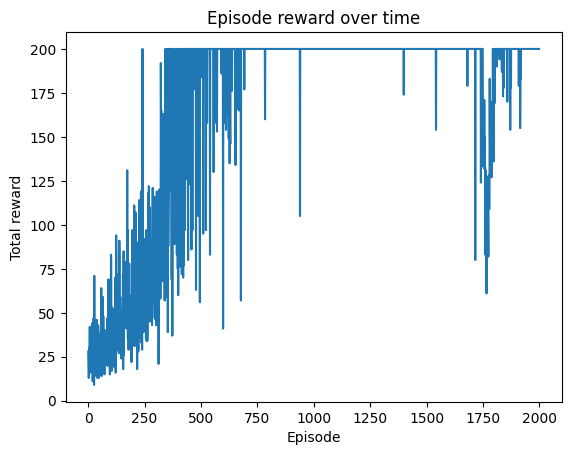

In [ ]:
import matplotlib.pyplot as plt
plt.plot(total_reward_episode)
plt.title('Episode reward over time')
plt.xlabel('Episode')
plt.ylabel('Total reward')
plt.show()